<a href="https://colab.research.google.com/github/doliq/PCVK/blob/main/Tubes_PCVK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Anggota Kelompok

# Diwa Arsyad Atthoriq / 06
# Mahardhika Bredy Dwi G. S / 16
# Satria Yudhistira Y. P / 26



# Import Library

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import zipfile

# Load Dataset

## Load MNIST

In [ ]:
from tensorflow.keras.datasets import mnist

In [ ]:
(train_data, train_labels), (test_data, test_labels) = mnist.load_data()

11490434/11490434 [==============================] - 1s 0us/step


In [ ]:
# Check shape data
(train_data.shape, test_data.shape)

((60000, 28, 28), (10000, 28, 28))

In [ ]:
# Check shape labels
(train_labels.shape, test_labels.shape)

((60000,), (10000,))

In [ ]:
# Check each data shape --> should be 28*28
train_data[0].shape

(28, 28)

In [ ]:
# Check the label
train_labels.shape

(60000,)

### Combine Train and Test Data

In [ ]:
digits_data = np.vstack([train_data, test_data])
digits_labels = np.hstack([train_labels, test_labels])

In [ ]:
# Check data shape
digits_data.shape

(70000, 28, 28)

In [ ]:
# Check label shape
digits_labels.shape

(70000,)

Text(0.5, 1.0, 'Class: 2')

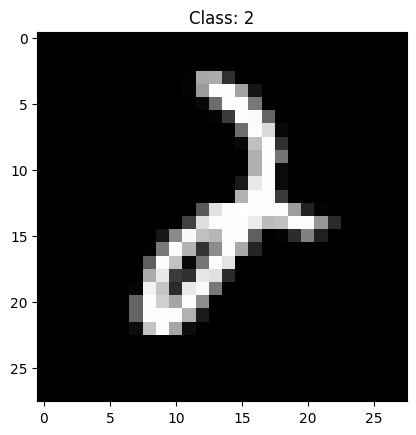

In [ ]:
# Randomly checking the data
idx = np.random.randint(0, digits_data.shape[0])
plt.imshow(digits_data[idx], cmap='gray')
plt.title('Class: ' + str(digits_labels[idx]))

<Axes: xlabel='Labels', ylabel='count'>

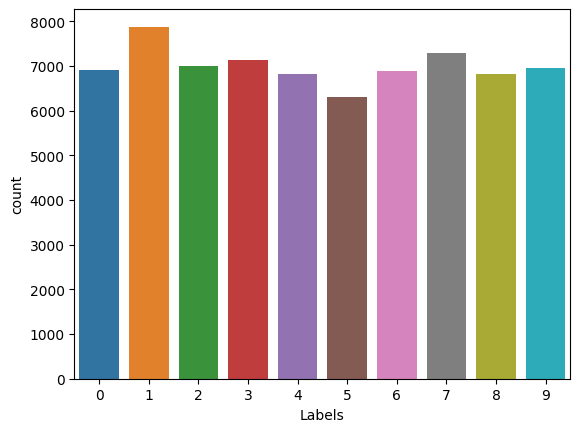

In [ ]:
# Check data distribution
df_labels = pd.DataFrame(digits_labels, columns=['Labels'])
sns.countplot(df_labels, x='Labels')

## Load Kaggle A-Z

In [ ]:
!wget https://iaexpert.academy/arquivos/alfabeto_A-Z.zip

--2023-12-15 01:55:16--  https://iaexpert.academy/arquivos/alfabeto_A-Z.zip
Resolving iaexpert.academy (iaexpert.academy)... 162.159.134.42
Connecting to iaexpert.academy (iaexpert.academy)|162.159.134.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 193643888 (185M) [application/zip]
Saving to: ‘alfabeto_A-Z.zip’

alfabeto_A-Z.zip    100%[===================>] 184.67M   329MB/s    in 0.6s    

2023-12-15 01:55:16 (329 MB/s) - ‘alfabeto_A-Z.zip’ saved [193643888/193643888]



In [ ]:
# Extract zip file
zip_object = zipfile.ZipFile(file = 'alfabeto_A-Z.zip', mode = 'r')
zip_object.extractall('./')
zip_object.close()

In [ ]:
dataset_az = pd.read_csv('A_Z Handwritten Data.csv').astype('float32')
dataset_az

,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,...,0.639,0.640,0.641,0.642,0.643,0.644,0.645,0.646,0.647,0.648
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372445,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372446,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372447,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372448,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Get pixel data only
alphabet_data = dataset_az.drop('0', axis=1)
# Get labels only
alphabet_labels = dataset_az['0']

In [ ]:
# Check shape data
alphabet_data.shape, alphabet_labels.shape

((372450, 784), (372450,))

In [ ]:
# Check shape labels
alphabet_labels.shape

(372450,)

In [ ]:
# Reshape pixel data to 28*28
alphabet_data = np.reshape(alphabet_data.values, (alphabet_data.shape[0], 28, 28))
# Check the result by its shape
alphabet_data.shape

(372450, 28, 28)

Text(0.5, 1.0, 'Class: 12.0')

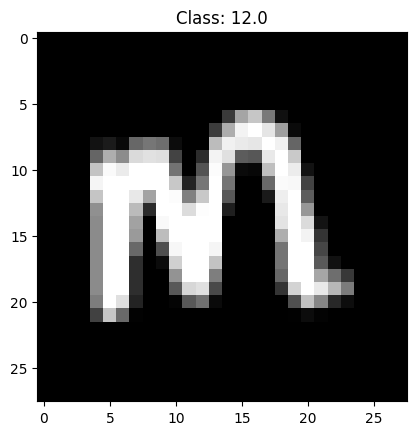

In [ ]:
# Randomly checking A-Z dataset
index = np.random.randint(0, alphabet_data.shape[0])
plt.imshow(alphabet_data[index], cmap = 'gray')
plt.title('Class: ' + str(alphabet_labels[index]))

<Axes: xlabel='Labels', ylabel='count'>

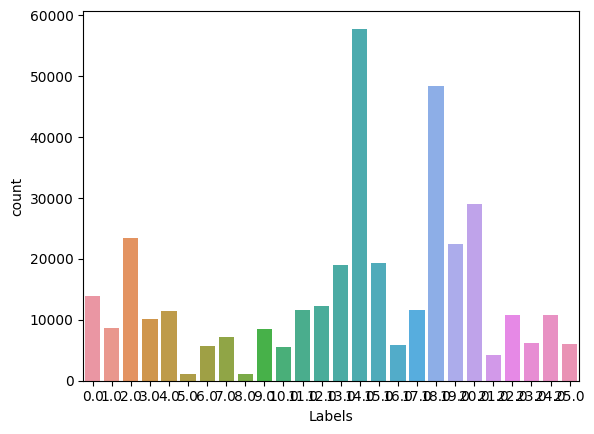

In [ ]:
# Check data distribution
df_az_labels = pd.DataFrame({
    'Labels': alphabet_labels.values
})
sns.countplot(df_az_labels, x='Labels')

## Combine Dataset (MNIST + Kaggel A-Z)

In [ ]:
# Check unique value from digits_labels
np.unique(digits_labels)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

In [ ]:
# Check unique value from alphabet_labels
np.unique(alphabet_labels)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.],
      dtype=float32)

In [ ]:
# We already know that digits labels containt labels from 0-9 (10 labels)
# We also know that alphabet labels start from 0-25 which represent A-Z
# If we want to combine them, the A-Z labels should continuing the digits label

alphabet_labels += 10

In [ ]:
# check alphabet labels again
np.unique(alphabet_labels)

array([10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22.,
       23., 24., 25., 26., 27., 28., 29., 30., 31., 32., 33., 34., 35.],
      dtype=float32)

In [ ]:
# Combine both of them
data = np.vstack([alphabet_data, digits_data])
labels = np.hstack([alphabet_labels, digits_labels])

In [ ]:
# Check the shape
data.shape, labels.shape

((442450, 28, 28), (442450,))

In [ ]:
# Check labels
np.unique(labels)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35.], dtype=float32)

In [ ]:
# Convert data to float32
data = np.array(data, dtype = 'float32')

In [ ]:
# Since Convolutional need 3d data (including depth)
# and our images only in 2d data (because in grayscale format)
# we need to add "the depth" to the data
data = np.expand_dims(data, axis=-1)

# check shape
data.shape

(442450, 28, 28, 1)

# Preprocessing

In [ ]:
# Normalize data
data /= 255.0

In [ ]:
# Check range value of data
data[0].min(), data[0].max()

(0.0, 1.0)

In [ ]:
# Enconde the labels
# LabelBinarizer similar with OneHotEncoder
le = LabelBinarizer()
labels = le.fit_transform(labels)

In [ ]:
# Check labels shape
labels.shape

(442450, 36)

Text(0.5, 1.0, '[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]')

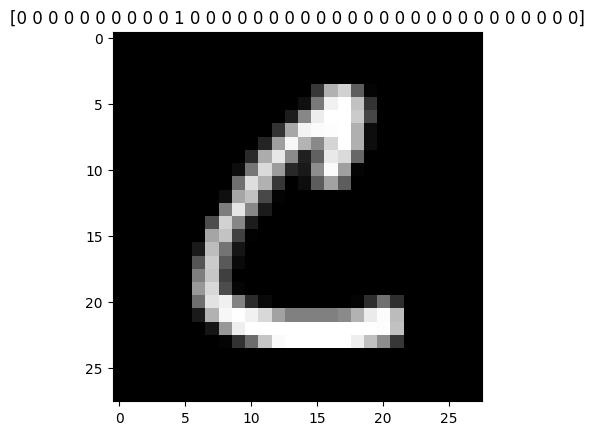

In [ ]:
# Check data with label binarizer's label
plt.imshow(data[30000].reshape(28,28), cmap='gray')
plt.title(str(labels[0]))

In [ ]:
# Since our data is not balance, we will handle it by giving weight for 'small' data

# Check number of data for each labels first
classes_total = labels.sum(axis = 0)
classes_total

array([ 6903,  7877,  6990,  7141,  6824,  6313,  6876,  7293,  6825,
        6958, 13869,  8668, 23409, 10134, 11440,  1163,  5762,  7218,
        1120,  8493,  5603, 11586, 12336, 19010, 57825, 19341,  5812,
       11566, 48419, 22495, 29008,  4182, 10784,  6272, 10859,  6076])

In [ ]:
# Check the biggest value of data
classes_total.max()

57825

In [ ]:
# Create a weight for each data
classes_weights = {}
for i in range(0, len(classes_total)):
  #print(i)
  classes_weights[i] = classes_total.max() / classes_total[i]

# Check the weight for each data
classes_weights

{0: 8.376792698826597,
 1: 7.340992763742541,
 2: 8.272532188841202,
 3: 8.097605377398123,
 4: 8.473769050410317,
 5: 9.15967052114684,
 6: 8.409685863874346,
 7: 7.928835870012341,
 8: 8.472527472527473,
 9: 8.310577752227651,
 10: 4.169370538611291,
 11: 6.671089063221043,
 12: 2.4702037677816224,
 13: 5.7060390763765545,
 14: 5.0546328671328675,
 15: 49.72055030094583,
 16: 10.035577924331829,
 17: 8.011221945137157,
 18: 51.629464285714285,
 19: 6.808548216178029,
 20: 10.320364090665715,
 21: 4.990937338166753,
 22: 4.6875,
 23: 3.0418200946870066,
 24: 1.0,
 25: 2.989762680316426,
 26: 9.94924294562973,
 27: 4.999567698426422,
 28: 1.1942625828703608,
 29: 2.5705712380529007,
 30: 1.993415609487038,
 31: 13.827116212338593,
 32: 5.362110534124629,
 33: 9.21954719387755,
 34: 5.3250759738465785,
 35: 9.51695194206715}

# Split Data to Train and Test

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size = 0.2, random_state = 1, stratify = labels)

## Create Data Augmentation

In [ ]:
# Import library
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
augmentation = ImageDataGenerator(rotation_range = 10, zoom_range=0.05, width_shift_range=0.1,
                                  height_shift_range=0.1, horizontal_flip = False)

# Build CNN Model

In [ ]:
# Import library
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
# Build the network
network = Sequential()

network.add(Conv2D(filters = 32, kernel_size=(3,3), activation='relu', input_shape=(28,28,1)))
network.add(MaxPool2D(pool_size=(2,2)))

network.add(Conv2D(filters = 64, kernel_size=(3,3), activation='relu', padding='same'))
network.add(MaxPool2D(pool_size=(2,2)))

network.add(Conv2D(filters = 128, kernel_size=(3,3), activation='relu', padding='valid'))
network.add(MaxPool2D(pool_size=(2,2)))

network.add(Flatten())

network.add(Dense(64, activation = 'relu'))
network.add(Dense(128, activation = 'relu'))

# output
network.add(Dense(36, activation='softmax'))

network.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [ ]:
# Check network summary
network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

In [ ]:
# Create actual labels
name_labels = '0123456789'
name_labels += 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
name_labels = [l for l in name_labels]

# Check actual label
print(name_labels)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
import joblib

joblib.dump(name_labels, "labels.pkl")

['labels.pkl']

In [ ]:
a = joblib.load("labels.pkl")
print(a)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


# Evaluate Model

## Make a Single Prediction

In [ ]:
# make a prediction
predictions = load_network.predict(X_test, batch_size=batch_size)

692/692 [==============================] - 2s 2ms/step


In [ ]:
# Check prediction for data-0
# You will get the probability for each label
# The highest one is the prediction
predictions[10]

array([1.80320185e-08, 3.27222624e-13, 2.54780508e-09, 6.94133007e-07,
       4.65343986e-10, 1.80982817e-02, 4.39556743e-07, 2.43115269e-15,
       1.21242692e-07, 1.21686371e-05, 3.56352250e-14, 2.40154208e-07,
       2.70720912e-09, 6.09180217e-09, 2.50939081e-13, 2.56742852e-14,
       8.08979967e-05, 1.28549569e-13, 4.52153342e-18, 6.91846310e-07,
       1.15221865e-09, 2.72903566e-09, 1.57211314e-14, 1.22876067e-11,
       1.48316595e-08, 8.65248406e-09, 3.18002655e-08, 3.37737298e-13,
       9.81806278e-01, 3.02508261e-11, 1.80111703e-10, 3.65869004e-14,
       2.39993008e-11, 1.55390550e-16, 1.41519493e-07, 3.38965273e-10],
      dtype=float32)

In [ ]:
# Get the actual prediction -> highest probability
np.argmax(predictions[10])

28

In [ ]:
# Check label for 24
name_labels[28]

'S'

In [ ]:
# Check y_test label for 0
y_test[10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
# check the highest value
np.argmax(y_test[10])

28

In [ ]:
# Check the label of y_test 0
name_labels[np.argmax(y_test[10])]

'S'

## Make an Evaluation on Test Data

In [ ]:
# Evaluate on test data
load_network.evaluate(X_test, y_test)

2766/2766 [==============================] - 9s 3ms/step - loss: 0.1420 - accuracy: 0.9455


[0.1420445591211319, 0.9455305933952332]

In [ ]:
# Print Classification Report
print(classification_report(y_test.argmax(axis=1), predictions.argmax(axis=1), target_names = name_labels))

              precision    recall  f1-score   support

           0       0.29      0.71      0.42      1381
           1       0.97      1.00      0.98      1575
           2       0.92      0.97      0.95      1398
           3       0.98      0.99      0.98      1428
           4       0.90      0.98      0.94      1365
           5       0.64      0.94      0.76      1263
           6       0.96      0.97      0.97      1375
           7       0.95      1.00      0.97      1459
           8       0.97      0.99      0.98      1365
           9       0.97      0.99      0.98      1392
           A       1.00      0.99      0.99      2774
           B       0.98      0.99      0.98      1734
           C       0.99      0.99      0.99      4682
           D       0.91      0.98      0.94      2027
           E       0.99      0.99      0.99      2288
           F       0.99      0.99      0.99       233
           G       0.97      0.95      0.96      1152
           H       0.98    

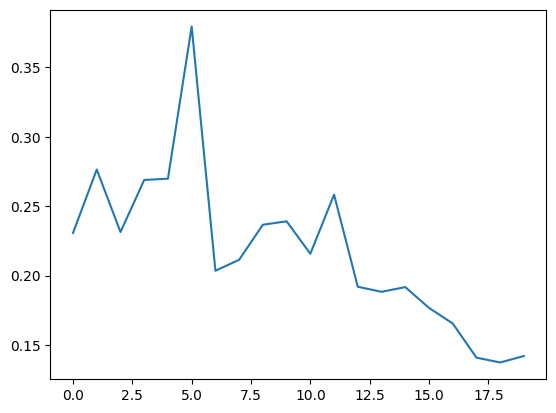

In [ ]:
# Visualize loss value for each epoch
plt.plot(history.history['val_loss'])

In [ ]:
# You can also check the another metrics
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

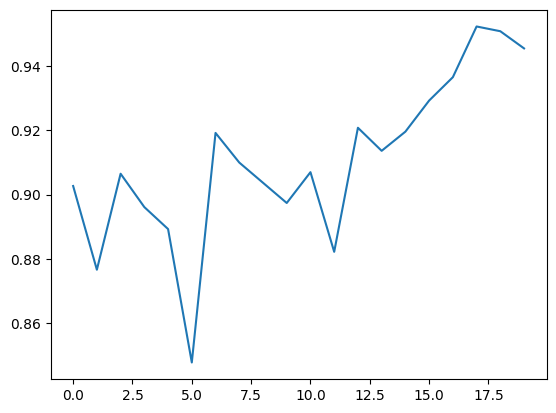

In [ ]:
# Check the model performance by validation accuracy
plt.plot(history.history['val_accuracy'])

# Save The Model

In [ ]:
# The result will show in colab directory
network.save('/content/drive/MyDrive/PCVK/network.keras')

# Testing on Real Image

In [ ]:
# Import library
from tensorflow.keras.models import load_model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load saved network
load_network = load_model('/content/drive/MyDrive/PCVK/network.keras')

In [ ]:
# Check summary
load_network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

## Train model

In [ ]:
# Set model name, epoch, and batch size
file_model = 'custom_ocr.model'
epochs = 20
batch_size = 128

In [ ]:
# Setup checkpoint
checkpointer = ModelCheckpoint(file_model, monitor = 'val_loss', verbose = 1, save_best_only=True)

In [ ]:
# Fit the model
history = network.fit(augmentation.flow(X_train, y_train, batch_size=batch_size),
                      validation_data = (X_test, y_test),
                      steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
                      class_weight = classes_weights, verbose=1, callbacks=[checkpointer])

Epoch 1/20
2765/2765 [==============================] - ETA: 0s - loss: 0.9224 - accuracy: 0.9074
Epoch 1: val_loss improved from 0.24294 to 0.23072, saving model to custom_ocr.model
2765/2765 [==============================] - 143s 52ms/step - loss: 0.9224 - accuracy: 0.9074 - val_loss: 0.2307 - val_accuracy: 0.9027
Epoch 2/20
2765/2765 [==============================] - ETA: 0s - loss: 0.7849 - accuracy: 0.9165
Epoch 2: val_loss did not improve from 0.23072
2765/2765 [==============================] - 128s 46ms/step - loss: 0.7849 - accuracy: 0.9165 - val_loss: 0.2764 - val_accuracy: 0.8766
Epoch 3/20
2765/2765 [==============================] - ETA: 0s - loss: 0.7105 - accuracy: 0.9231
Epoch 3: val_loss did not improve from 0.23072
2765/2765 [==============================] - 123s 45ms/step - loss: 0.7105 - accuracy: 0.9231 - val_loss: 0.2314 - val_accuracy: 0.9065
Epoch 4/20
2765/2765 [==============================] - ETA: 0s - loss: 0.6435 - accuracy: 0.9285
Epoch 4: val_loss did

# Face Detection

In [ ]:
import cv2
import os
import numpy as np
import imutils
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from sklearn.cluster import KMeans

In [ ]:
!pip install matplotlib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cascade = cv2.CascadeClassifier('/content/drive/MyDrive/PCVK/Images/haarcascades/haarcascade_frontalface_alt.xml')

**Gambar Pertama**

<Figure size 1000x1000 with 0 Axes>

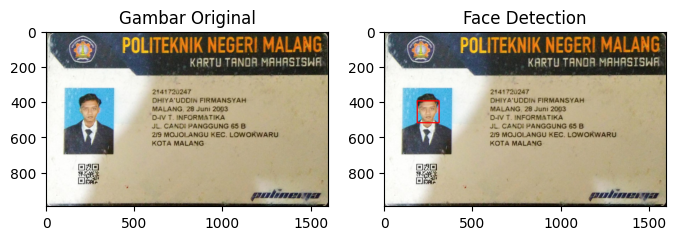

In [ ]:
# Membaca gambar mengubahnya ke RGB, dan membuat salinan
dhiya1 = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_1 - DHIYA_UDDIN FIRMANSYAH.jpg')
dhiya1_rgb = cv2.cvtColor(dhiya1, cv2.COLOR_BGR2RGB)
dhiya1_fd = dhiya1_rgb.copy()

# Mendeteksi wajah pada gambar 'badzlin4.jpg' dan menggambar kotak merah di sekitar wajah yang terdeteksi
fd_dhiya1 = cascade.detectMultiScale(dhiya1_fd)
for(x,y,w,h) in fd_dhiya1:
  cv2.rectangle(dhiya1_fd, (x,y),(x+w,y+h), (255,0,0), 5)

# Menampilkan gambar 'badzlin4.jpg' sebelum dan sesudah deteksi wajah
plt.figure(figsize = (10,10))
f, axarr = plt.subplots(1,2,figsize=(8,8))
plt.subplot(121)
plt.imshow(dhiya1_rgb)
plt.title('Gambar Original')
plt.subplot(122)
plt.imshow(dhiya1_fd)
plt.title('Face Detection')
plt.show()

**Gambar Kedua**

<Figure size 1000x1000 with 0 Axes>

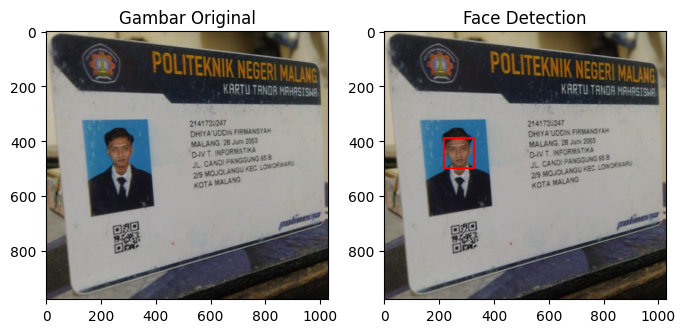

In [ ]:
# Membaca gambar 'badzlin4.jpg', mengubahnya ke RGB, dan membuat salinan
dhiya2 = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_2 - DHIYA_UDDIN FIRMANSYAH.jpg')
dhiya2_rgb = cv2.cvtColor(dhiya2, cv2.COLOR_BGR2RGB)
dhiya2_fd = dhiya2_rgb.copy()

# Mendeteksi wajah pada gambar 'badzlin4.jpg' dan menggambar kotak merah di sekitar wajah yang terdeteksi
fd_dhiya2 = cascade.detectMultiScale(dhiya2_fd)
for(x,y,w,h) in fd_dhiya2:
  cv2.rectangle(dhiya2_fd, (x,y),(x+w,y+h), (255,0,0), 5)

# Menampilkan gambar 'badzlin4.jpg' sebelum dan sesudah deteksi wajah
plt.figure(figsize = (10,10))
f, axarr = plt.subplots(1,2,figsize=(8,8))
plt.subplot(121)
plt.imshow(dhiya2_rgb)
plt.title('Gambar Original')
plt.subplot(122)
plt.imshow(dhiya2_fd)
plt.title('Face Detection')
plt.show()

**Gambar Ketiga**

<Figure size 1000x1000 with 0 Axes>

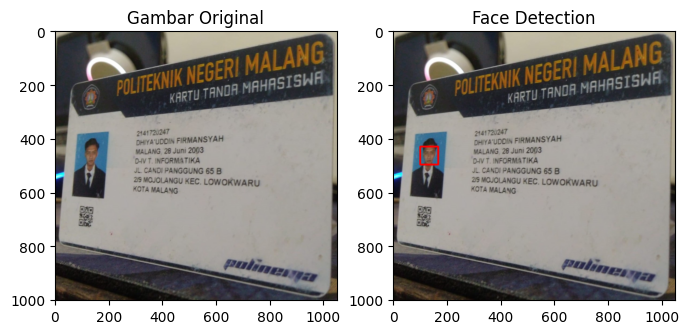

In [ ]:
# Membaca gambar, mengubahnya ke RGB, dan membuat salinan
dhiya3 = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_3 - DHIYA_UDDIN FIRMANSYAH.jpg')
dhiya3_rgb = cv2.cvtColor(dhiya3, cv2.COLOR_BGR2RGB)
dhiya3_fd = dhiya3_rgb.copy()

# Mendeteksi wajah pada gambar dan menggambar kotak merah di sekitar wajah yang terdeteksi
fd_dhiya3 = cascade.detectMultiScale(dhiya3_fd)
for(x,y,w,h) in fd_dhiya3:
  cv2.rectangle(dhiya3_fd, (x,y),(x+w,y+h), (255,0,0), 5)

# Menampilkan gambar sebelum dan sesudah deteksi wajah
plt.figure(figsize = (10,10))
f, axarr = plt.subplots(1,2,figsize=(8,8))
plt.subplot(121)
plt.imshow(dhiya3_rgb)
plt.title('Gambar Original')
plt.subplot(122)
plt.imshow(dhiya3_fd)
plt.title('Face Detection')
plt.show()

**Gambar Keempat**

<Figure size 1000x1000 with 0 Axes>

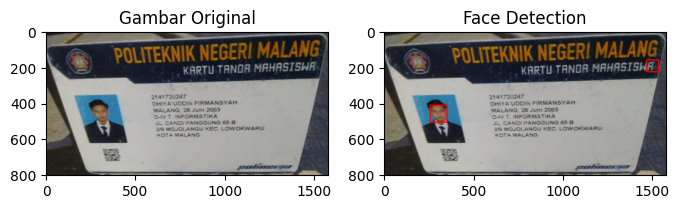

In [ ]:
# Membaca gambar, mengubahnya ke RGB, dan membuat salinan
dhiya4 = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_4 - DHIYA_UDDIN FIRMANSYAH.jpg')
dhiya4_rgb = cv2.cvtColor(dhiya4, cv2.COLOR_BGR2RGB)
dhiya4_fd = dhiya4_rgb.copy()

# Mendeteksi wajah pada gambar dan menggambar kotak merah di sekitar wajah yang terdeteksi
fd_dhiya4 = cascade.detectMultiScale(dhiya4_fd)
for(x,y,w,h) in fd_dhiya4:
  cv2.rectangle(dhiya4_fd, (x,y),(x+w,y+h), (255,0,0), 5)

# Menampilkan gambar sebelum dan sesudah deteksi wajah
plt.figure(figsize = (10,10))
f, axarr = plt.subplots(1,2,figsize=(8,8))
plt.subplot(121)
plt.imshow(dhiya4_rgb)
plt.title('Gambar Original')
plt.subplot(122)
plt.imshow(dhiya4_fd)
plt.title('Face Detection')
plt.show()

**Gambar Kelima**

<Figure size 1000x1000 with 0 Axes>

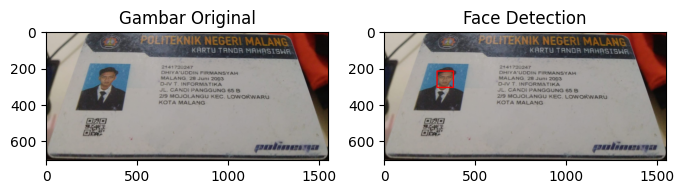

In [ ]:
# Membaca gambar, mengubahnya ke RGB, dan membuat salinan
dhiya5 = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_5 - DHIYA_UDDIN FIRMANSYAH.jpg')
dhiya5_rgb = cv2.cvtColor(dhiya5, cv2.COLOR_BGR2RGB)
dhiya5_fd = dhiya5_rgb.copy()

# Mendeteksi wajah pada gambar dan menggambar kotak merah di sekitar wajah yang terdeteksi
fd_dhiya5 = cascade.detectMultiScale(dhiya5_fd)
for(x,y,w,h) in fd_dhiya5:
  cv2.rectangle(dhiya5_fd, (x,y),(x+w,y+h), (255,0,0), 5)

# Menampilkan gambar sebelum dan sesudah deteksi wajah
plt.figure(figsize = (10,10))
f, axarr = plt.subplots(1,2,figsize=(8,8))
plt.subplot(121)
plt.imshow(dhiya5_rgb)
plt.title('Gambar Original')
plt.subplot(122)
plt.imshow(dhiya5_fd)
plt.title('Face Detection')
plt.show()

# PREPROCESSING IMAGE

In [ ]:
import numpy as np
import imutils
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
import imutils
from imutils import contours

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
network = load_model('/content/drive/MyDrive/PCVK/Images/network.unknown')
# check summary
network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

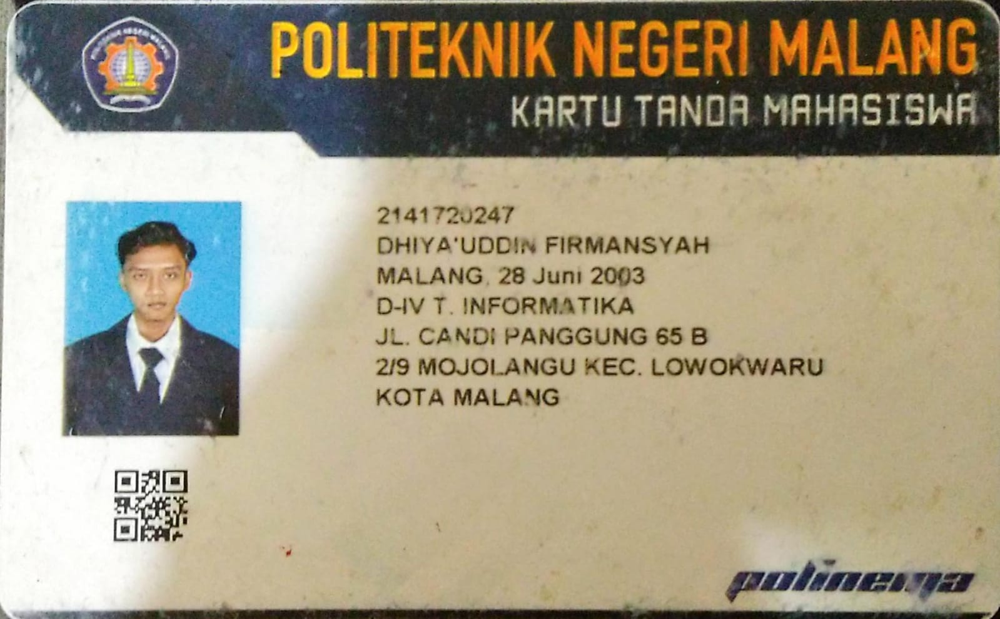

In [ ]:
img = cv2.imread('/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_1 - DHIYA_UDDIN FIRMANSYAH.jpg')
# show image in Colab
cv2_imshow(img)

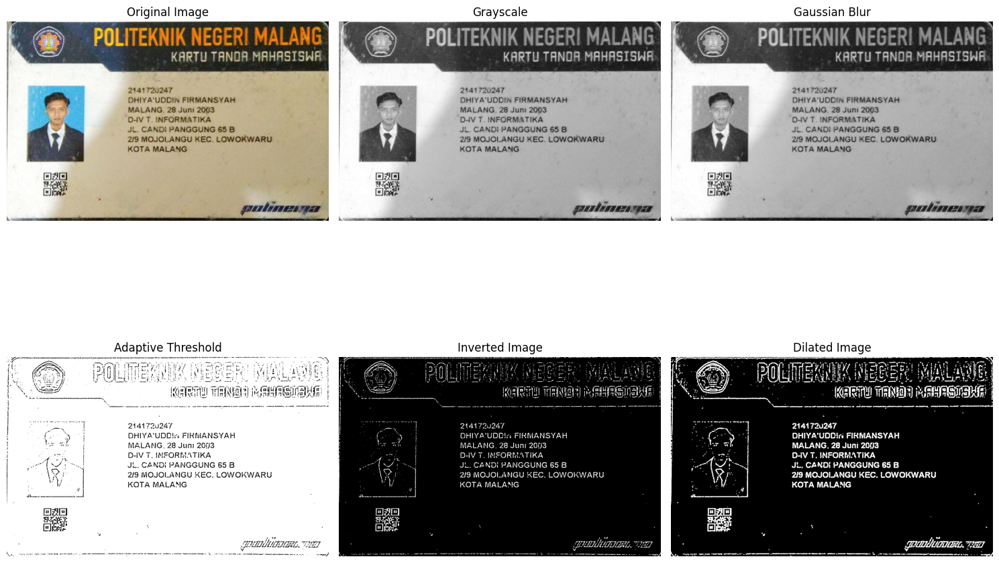

(array([[[138, 164, 158],
         [134, 160, 154],
         [126, 152, 146],
         ...,
         [ 10,  15,  18],
         [ 11,  16,  19],
         [ 14,  17,  21]],
 
        [[134, 160, 154],
         [130, 156, 150],
         [125, 151, 145],
         ...,
         [ 11,  16,  19],
         [ 13,  18,  21],
         [ 15,  18,  22]],
 
        [[128, 154, 148],
         [124, 150, 144],
         [121, 147, 141],
         ...,
         [ 14,  17,  21],
         [ 16,  19,  23],
         [ 17,  20,  24]],
 
        ...,
 
        [[124, 135, 133],
         [122, 133, 131],
         [121, 132, 130],
         ...,
         [  4,  10,  17],
         [  3,   9,  16],
         [  3,   9,  14]],
 
        [[124, 135, 133],
         [124, 135, 133],
         [125, 136, 134],
         ...,
         [  4,   7,  15],
         [  0,   6,  13],
         [  1,   7,  12]],
 
        [[122, 133, 131],
         [124, 135, 133],
         [127, 138, 136],
         ...,
         [  3,   6,  14],
  

In [ ]:
def preprocess_image(image_path):
    img = cv2.imread(image_path)

    # Display images using subplots
    plt.figure(figsize=(15, 12))

    # Display the original image
    plt.subplot(2, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.subplot(2, 3, 2)
    plt.imshow(gray, cmap='gray')
    plt.title('Grayscale')
    plt.axis('off')

    # Apply Gaussian Blur
    blur = cv2.GaussianBlur(gray, (3, 3), 0)
    plt.subplot(2, 3, 3)
    plt.imshow(blur, cmap='gray')
    plt.title('Gaussian Blur')
    plt.axis('off')

    # Apply Adaptive Threshold
    adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
    plt.subplot(2, 3, 4)
    plt.imshow(adaptive, cmap='gray')
    plt.title('Adaptive Threshold')
    plt.axis('off')

    # Invert the image
    invertion = 255 - adaptive
    plt.subplot(2, 3, 5)
    plt.imshow(invertion, cmap='gray')
    plt.title('Inverted Image')
    plt.axis('off')

    # Dilate the image
    dilation = cv2.dilate(invertion, np.ones((3, 3)))
    plt.subplot(2, 3, 6)
    plt.imshow(dilation, cmap='gray')
    plt.title('Dilated Image')
    plt.axis('off')

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

    return img, gray, dilation

# Call the function with the image path
image_path = '/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_1 - DHIYA_UDDIN FIRMANSYAH.jpg'
preprocess_image(image_path)


# Menentukan Contour

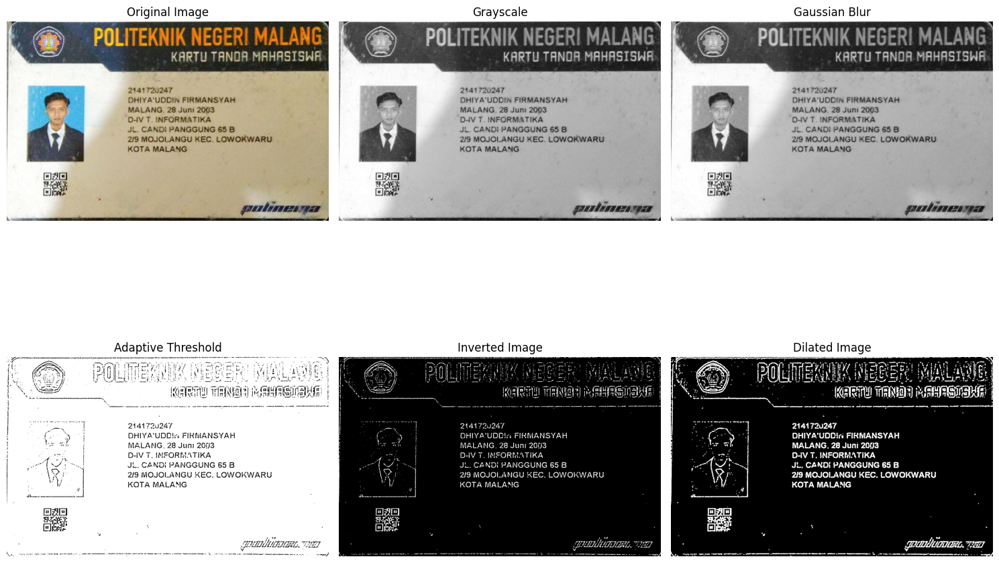

(array([[[  0, 967]],

       [[  0, 978]],

       [[  2, 980]],

       [[  5, 980]],

       [[  6, 981]],

       [[  6, 982]],

       [[  5, 983]],

       [[  5, 986]],

       [[ 10, 986]],

       [[ 11, 987]],

       [[ 10, 988]],

       [[ 10, 990]],

       [[ 18, 990]],

       [[ 18, 989]],

       [[ 17, 988]],

       [[ 15, 988]],

       [[ 14, 987]],

       [[ 11, 987]],

       [[ 10, 986]],

       [[ 11, 985]],

       [[ 11, 983]],

       [[  9, 981]],

       [[  7, 981]],

       [[  6, 980]],

       [[  6, 977]],

       [[  5, 976]],

       [[  4, 976]],

       [[  3, 975]],

       [[  3, 974]],

       [[  2, 973]],

       [[  2, 969]],

       [[  1, 968]],

       [[  1, 967]]], dtype=int32), array([[[  0, 728]],

       [[  0, 732]],

       [[  1, 732]],

       [[  1, 728]]], dtype=int32), array([[[  1, 507]],

       [[  1, 508]],

       [[  0, 509]],

       [[  0, 512]],

       [[  1, 513]],

       [[  1, 516]],

       [[  0, 517]],

   

In [ ]:
# Call the function with the image path
image_path = '/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_1 - DHIYA_UDDIN FIRMANSYAH.jpg'
original_image, gray_image, processed_image = preprocess_image(image_path)

# Define function for contour detection
def find_contours(processed_image):
    conts = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    conts = imutils.grab_contours(conts)
    conts = contours.sort_contours(conts, method='left-to-right')[0]

    return conts

contours_found = find_contours(processed_image)

# Check contour values
print(contours_found)


# Memberi Kotak Pembatas

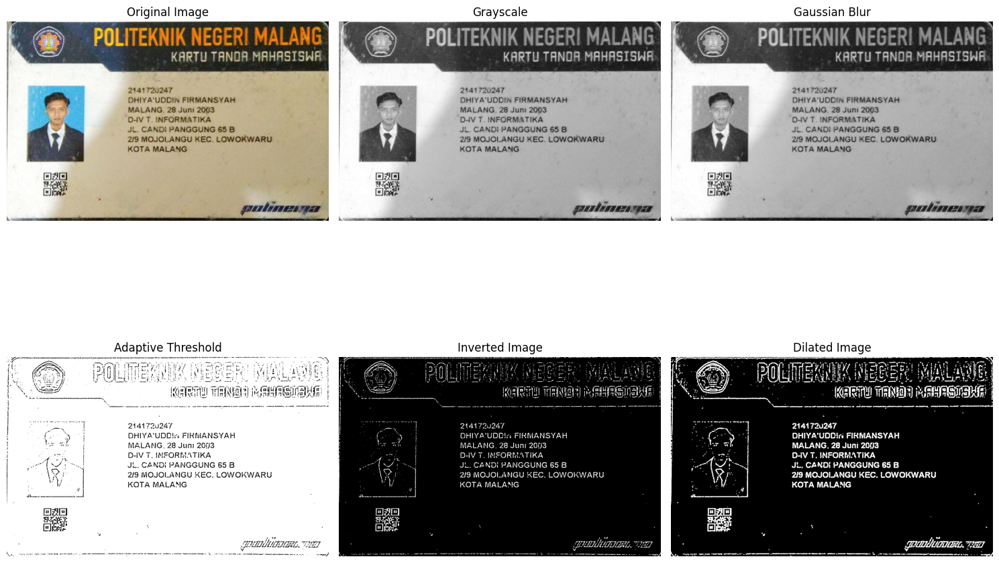

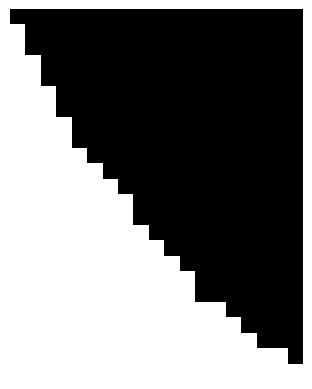

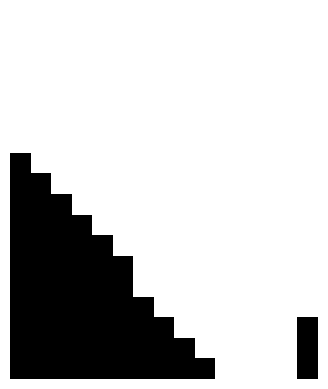

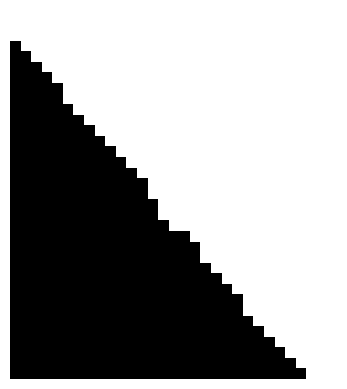

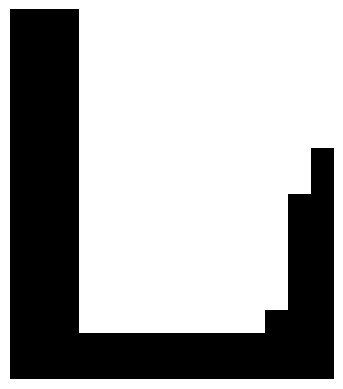

...

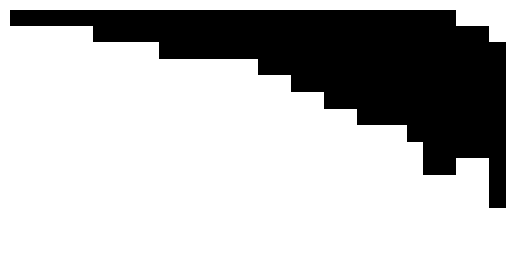

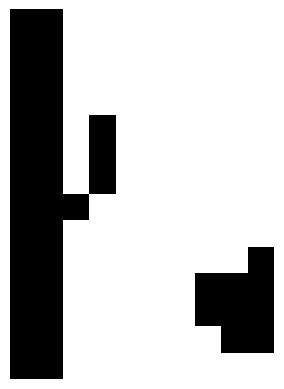

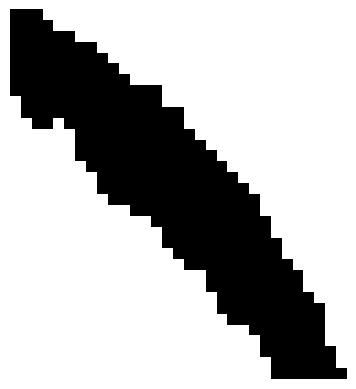

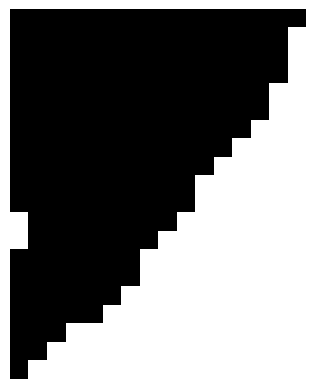

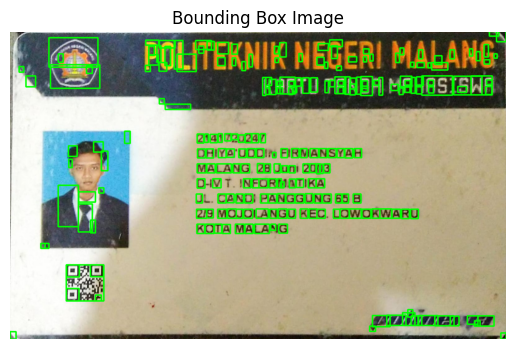

In [ ]:
# Call the function with the image path
image_path = '/content/drive/MyDrive/PCVK/Images/ktm/Dhiya/3E_2141720247_1 - DHIYA_UDDIN FIRMANSYAH.jpg'
original_image, gray_image, processed_image = preprocess_image(image_path)

# Setup min/max width/height for char
min_w, max_w = 10, 160
min_h, max_h = 14, 140  # original image for plotting contour result

for c in contours_found:
    (x, y, w, h) = cv2.boundingRect(c)  # find bounding box based on contour

    # Check if pixel follows the specified rule, consider it as a char
    if min_w <= w <= max_w and min_h <= h <= max_h:
        roi = gray_image[y:y+h, x:x+w]  # get region of interest for char
        thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

        # Display the threshold image using Matplotlib
        plt.imshow(thresh, cmap='gray')
        plt.axis('off')
        plt.show()

        # Build bounding box on the original image
        cv2.rectangle(original_image, (x, y), (x+w, y+h), (0, 255, 0), 3)

# Show bounding box on the original image using Matplotlib
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Bounding Box Image')
plt.axis('off')
plt.show()

# Wait for a key press and close all OpenCV windows
cv2.waitKey(0)
cv2.destroyAllWindows()

# Mengekstrak Region of Interest (ROI) dari citra asli

In [ ]:
def extract_roi(original_image):
  roi = original_image[y:y+h, x:x+w]
  return roi

# Melakukan thresholding pada citra asli

In [ ]:
def thresholding(original_image):
  thresh = cv2.threshold(original_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  return thresh

# Mengubah ukuran citra menjadi ukuran 28x28

In [ ]:
def resize_img(original_image, w, h):
  if w > h:
    resized = imutils.resize(original_image, width=28)
  else:
    resized = imutils.resize(original_image, height=28)

  # (w, h) = resized.shape
  (h, w) = resized.shape

  # Calculate how many pixels need to fill char image
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

In [ ]:
# Demo for enlarge
(x, y, w, h) = cv2.boundingRect(contours_found[1])
test_image = thresholding(gray_image[y:y+h, x:x+w])

# show original test image
cv2_imshow(test_image)

# Show enlarge test image
cv2_imshow(cv2.resize(test_image, (28,28)))

In [ ]:
# Demo by filled strategy
# (w, h) = test_image.shape
(h, w) = test_image.shape

test_image2 = resize_img(test_image, w, h)

cv2_imshow(test_image)
cv2_imshow(test_image2)

In [ ]:
def normalization(original_image):
  img = original_image.astype('float32') / 255.0 # convert to floating point
  img = np.expand_dims(original_image, axis=-1) # add depth
  return img

In [ ]:
# Check
test_image2.shape, normalization(test_image2).shape

((28, 28), (28, 28, 1))

In [ ]:
def process_box(gray_image, x, y, w, h):

  roi = extract_roi(gray_image)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)

  # show result
  cv2_imshow(resized)

  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [ ]:
# Detect every single char from contour
detected_char = []

for c in contours_found:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 10, 160
  min_h, max_h = 14, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char.append(process_box(gray_image, x, y, w, h))

In [ ]:
# check pixel for detected char sample
detected_char[0][0]

array([[[  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0]],

       [[  0],
        [  0],
        [  0],
        [213],
        [ 34],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0]],

       [[  0],
        [  0],
        [  0],
        [255],
        [ 40],
        [  0],
        [  0],
        [  0],
        [  0],
        [  0],
      

In [ ]:
# check bounding box for detected char sample
detected_char[0][1]

(0, 967, 19, 24)

In [ ]:
# Get all char pixel
pixels = np.array([px[0] for px in detected_char], dtype='float32')

# Get all box for detected char
boxes = [box[1] for box in detected_char]

pixels.shape

(233, 28, 28, 1)

In [ ]:
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNOPQRSTUVWZYZ'
char_list = digits + letters
char_list = [ch for ch in char_list]

print(char_list)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'Z', 'Y', 'Z']


In [ ]:
# Predict
preds = network.predict(pixels)

# check shape
preds.shape

8/8 [==============================] - 0s 12ms/step


(233, 36)

In [ ]:
# Char Prediction
for p in preds:
  char_idx = np.argmax(p)
  print(char_list[char_idx], end = " ")

L 7 J Z J R W Z C U B B M Y 8 H A C O 7 A 3 7 Z J 7 N 7 8 N 7 M T 4 U 5 S J D K O N 2 N M 5 O A S A N 4 V T Q N M N C 7 3 A 8 A A O 0 8 O N N M J N U C J N N O A 2 O 1 4 8 Q D C 2 O H T J O 3 N A A 8 H M A J Z D 3 N D M S S S N K Y U O U 7 M Z A A J C T T 8 K N 8 2 U K C M A 8 N A C C T A N J S 3 H T S J N C L S O S 7 M M O S A J M N N J O H T J N 7 M A M 7 O K M T 7 N M N A 8 J Y N R N N N 4 U Z A L A M C M M O R 7 M A H U T D K B M U S N U 7 M K K J A R Z S W 

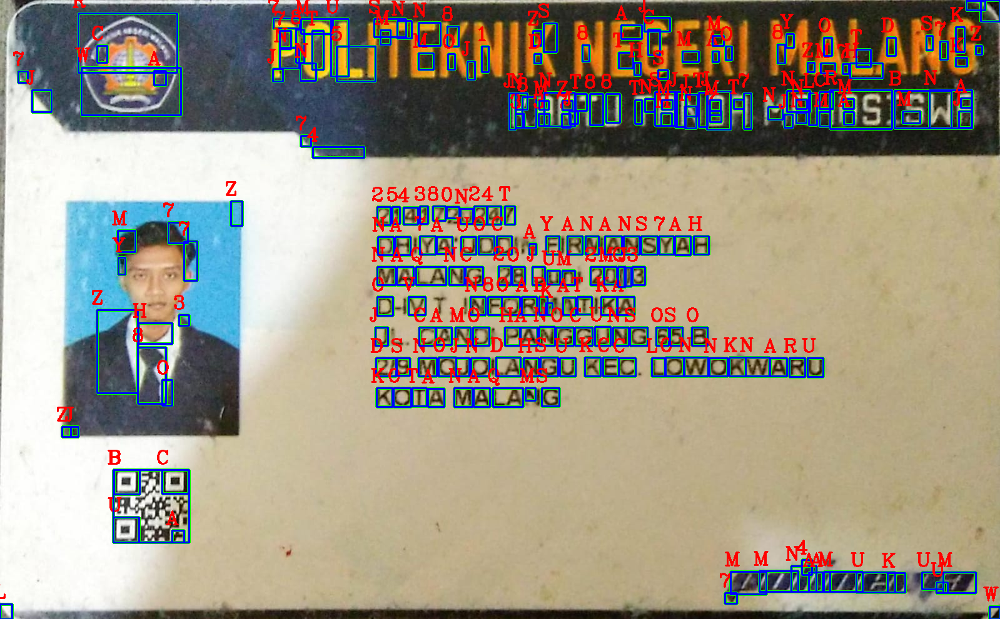

In [ ]:
# Show char with actual image
img_copy2 = original_image.copy()

for(pred, (x, y, w, h)) in zip(preds, boxes):
  i = np.argmax(pred)
  char_detected = char_list[i]

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 2)
  cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 2)

cv2_imshow(img_copy2)